In [1]:
# The usual imports, I don't even recall at this point which are relevant. 
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True


In [2]:
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

In [3]:
data=Table.read('gzh_3_23_with_urls')

# 2nd Tier Tasks
 Task 12 - Clumpiness: need to set criteria on p_features
 
 Task 7 - Roundedness: need to set criteria on p_features

In [4]:
#Clumpy question. Previous task: smooth_or_features. 

#First define the task in question:
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction' # vote fraction for task
N_clumpy = 't12_clumpy_total_weight' # number of votes for task
#and the previous task:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
N_smooth_or_features = 't01_smooth_or_features_total_weight' # number of votes for previous task

# if we want discrete bins instead of minimum thresholds:

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_clumpy]>=N_cut) & (data[N_smooth_or_features]>=N_cut)



# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,11)


fraction_list=[]
err_list=[]
for p in p_prev_task_list:
    task_data = (data[p_features]>p-.05) & (data[p_features]<p+.05) & min_N

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list.append(np.nanmean(data[task_data][p_clumpy_yes]))
    try:
        err_list.append(np.nanstd(data[task_data][p_clumpy_yes])/np.sqrt(N_in_bin))
    except TypeError:
        err_list.append(0)

y1 = [f+e for f,e in zip(fraction_list,err_list)]
y2 = [f-e for f,e in zip(fraction_list,err_list)]

/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


/usr/local/lib/python2.7/dist-packages/numpy/ma/core.py:4089: UserWarning: Warning: converting a masked element to nan.
  warnings.warn("Warning: converting a masked element to nan.")


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


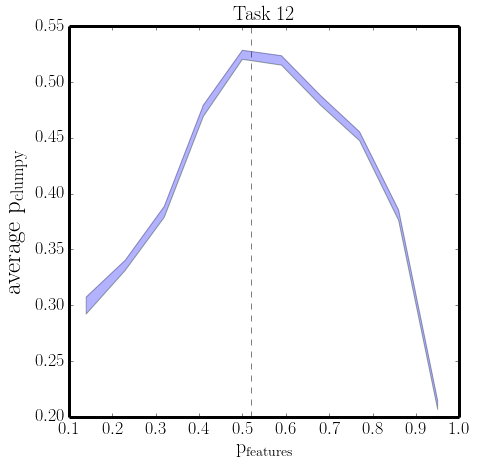

In [5]:

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(7,7))

plt.plot(p_prev_task_list,y1,alpha=.1)
plt.plot(p_prev_task_list,y2,alpha=.1)
plt.fill_between(p_prev_task_list,y1,y2,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{clumpy}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{features}}$',fontsize=20)
plt.title(r'$\mathrm{Task~12}$',fontsize=20)
plt.axvline(x=.52,ls='dashed',color='k',alpha=.5)

Evaluating galaxies for clumpiness can be found with:
p_features > 0.52

Visual check that this seems aight:

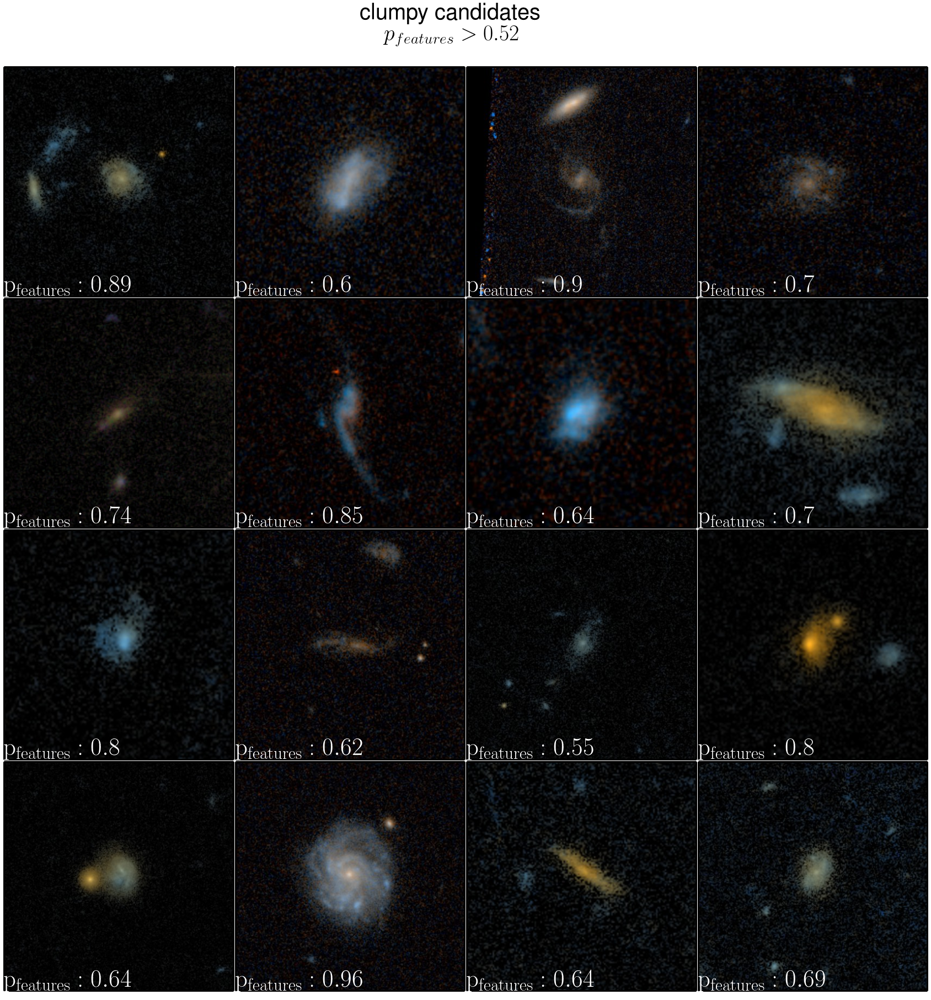

In [7]:
p_features_threshold=0.52
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria=(data[p_features]>p_features_threshold)#Clumpy question. Previous task: smooth_or_features. 
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{features}: %s}$'%(round(gal[p_features],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clumpy candidates\n$p_{features} > %s$'%p_features_threshold, fontsize=40,ha='center')





In [16]:
#Roundedness question. Previous task: smooth_or_features. 

#First define the task in question:
p_rounded_completely = 't07_rounded_a01_completely_round_weighted_fraction' # vote fraction for task
p_rounded_between = 't07_rounded_a02_in_between_weighted_fraction'
p_rounded_cigar = 't07_rounded_a03_cigar_shaped_weighted_fraction'
N_rounded = 't07_rounded_total_weight' # number of votes for task
#and the previous task:
p_smooth = 't01_smooth_or_features_a01_smooth_best_fraction' # vote fraction for previous task
N_smooth_or_features = 't01_smooth_or_features_total_weight' # number of votes for previous task

# if we want discrete bins instead of minimum thresholds:

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_rounded]>=N_cut) & (data[N_smooth_or_features]>=N_cut)



# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_completely=[]
err_list_completely=[]
fraction_list_between=[]
err_list_between=[]
fraction_list_cigar=[]
err_list_cigar=[]

for p in p_prev_task_list:
    task_data = (data[p_smooth]>p-.05) & (data[p_smooth]<p+.05) & min_N

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_completely.append(np.nanmean(data[task_data][p_rounded_completely]))
    fraction_list_between.append(np.nanmean(data[task_data][p_rounded_between]))
    fraction_list_cigar.append(np.nanmean(data[task_data][p_rounded_cigar]))

    try:
        err_list_completely.append(np.nanstd(data[task_data][p_rounded_completely])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_completely.append(0)
    try:
        err_list_between.append(np.nanstd(data[task_data][p_rounded_between])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_between.append(0)
    try:
        err_list_cigar.append(np.nanstd(data[task_data][p_rounded_cigar])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_cigar.append(0)

y1_completely = [f+e for f,e in zip(fraction_list_completely,err_list_completely)]
y2_completely = [f-e for f,e in zip(fraction_list_completely,err_list_completely)]

y1_between = [f+e for f,e in zip(fraction_list_between,err_list_between)]
y2_between = [f-e for f,e in zip(fraction_list_between,err_list_between)]

y1_cigar = [f+e for f,e in zip(fraction_list_cigar,err_list_cigar)]
y2_cigar = [f-e for f,e in zip(fraction_list_cigar,err_list_cigar)]


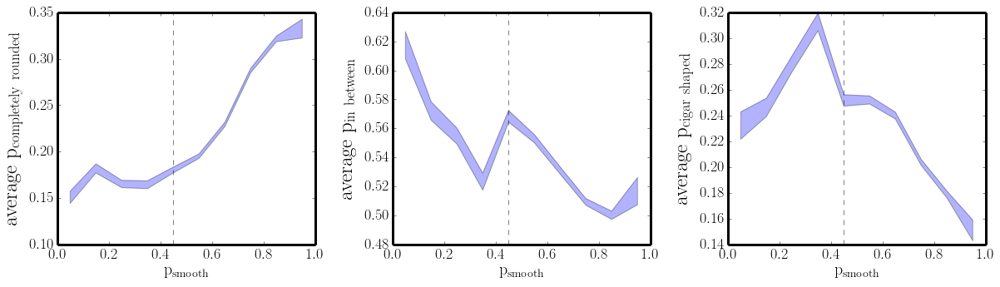

In [33]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(20,5))
gs=gridspec.GridSpec(1,3)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_completely,alpha=.1)
plt.plot(p_prev_task_list,y2_completely,alpha=.1)
plt.fill_between(p_prev_task_list,y1_completely,y2_completely,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{completely~rounded}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=.45,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_between,alpha=.1)
plt.plot(p_prev_task_list,y2_between,alpha=.1)
plt.fill_between(p_prev_task_list,y1_between,y2_between,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{in~between}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=.45,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,2])
plt.plot(p_prev_task_list,y1_cigar,alpha=.1)
plt.plot(p_prev_task_list,y2_cigar,alpha=.1)
plt.fill_between(p_prev_task_list,y1_cigar,y2_cigar,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{cigar~shaped}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=.45,ls='dashed',color='k',alpha=.5)


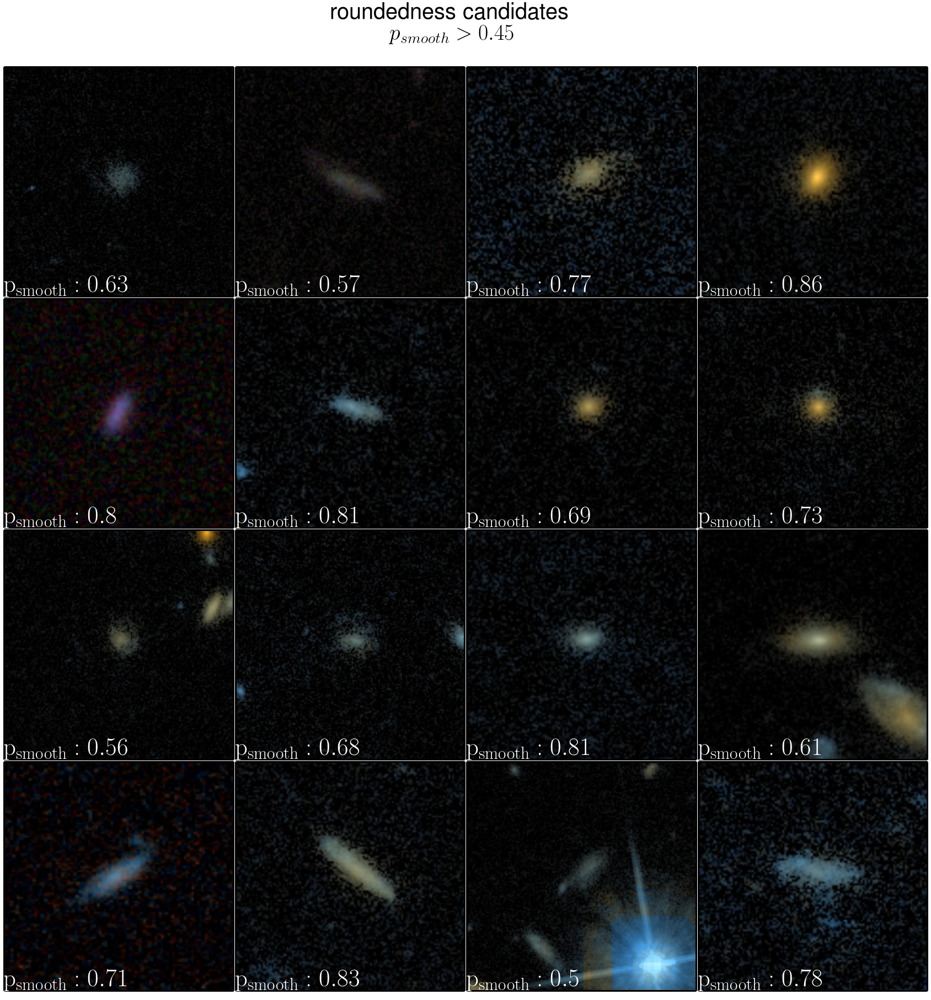

In [35]:
p_smooth_threshold=0.45
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria=(data[p_smooth]>p_smooth_threshold)#roundedness question. Previous task: smooth_or_features. 

these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{smooth}: %s}$'%(round(gal[p_smooth],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'roundedness candidates\n$p_{smooth} > %s$'%p_smooth_threshold, fontsize=40,ha='center')





# 3rd Tier Tasks
Task 16: How many clumps? 

Previous responses: p_features, p_clumpy_yes


Task 2: Edge-on? 

Previous responses: p_features, p_clumpy_no,

In [10]:
# Task 16 - Evaluating clump number. Need p_features > 0.52, now to find what p_clumpy_yes should be. 

#Roundedness question. Previous task: smooth_or_features. 

#First define the task in question:
p_1 = 't16_clumps_count_a01_1_weighted_fraction' # vote fraction for task
p_2 = 't16_clumps_count_a01_1_weighted_fraction'
p_3 = 't16_clumps_count_a03_3_weighted_fraction'
p_4 = 't16_clumps_count_a04_4_weighted_fraction' # vote fraction for task
p_m4 = 't16_clumps_count_a05_more_than_4_fraction'
p_ct = 't16_clumps_count_a06_cant_tell_weighted_fraction'
N_clump_number = 't16_clumps_count_total_weight' # number of votes for task
#and the previous task:
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction' # vote fraction for previous task
N_clumpy = 't12_clumpy_total_weight' # number of votes for previous task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_clumpy]>=N_cut) & (data[N_smooth_or_features]>=N_cut) & (data[N_clump_number]>=N_cut)



# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_1=[]
err_list_1=[]
fraction_list_2=[]
err_list_2=[]
fraction_list_3=[]
err_list_3=[]
fraction_list_4=[]
err_list_4=[]
fraction_list_m4=[]
err_list_m4=[]
fraction_list_ct=[]
err_list_ct=[]

for p in p_prev_task_list:
    task_data = (data[p_clumpy_yes]>p-.05) & (data[p_clumpy_yes]<p+.05) & min_N & (data[p_features]>0.52)

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_1.append(np.nanmean(data[task_data][p_1]))
    fraction_list_2.append(np.nanmean(data[task_data][p_2]))
    fraction_list_3.append(np.nanmean(data[task_data][p_3]))
    fraction_list_4.append(np.nanmean(data[task_data][p_4]))
    fraction_list_m4.append(np.nanmean(data[task_data][p_m4]))
    fraction_list_ct.append(np.nanmean(data[task_data][p_ct]))


    try:
        err_list_1.append(np.nanstd(data[task_data][p_1])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_1.append(0)
    try:
        err_list_2.append(np.nanstd(data[task_data][p_2])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_2.append(0)
    try:
        err_list_3.append(np.nanstd(data[task_data][p_3])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_3.append(0)
    try:
        err_list_4.append(np.nanstd(data[task_data][p_4])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_4.append(0)
    try:
        err_list_m4.append(np.nanstd(data[task_data][p_m4])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_m4.append(0)
    try:
        err_list_ct.append(np.nanstd(data[task_data][p_ct])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_ct.append(0)

y1_1 = [f+e for f,e in zip(fraction_list_1,err_list_1)]
y2_1 = [f-e for f,e in zip(fraction_list_1,err_list_1)]

y1_2 = [f+e for f,e in zip(fraction_list_2,err_list_2)]
y2_2 = [f-e for f,e in zip(fraction_list_2,err_list_2)]

y1_3 = [f+e for f,e in zip(fraction_list_3,err_list_3)]
y2_3 = [f-e for f,e in zip(fraction_list_3,err_list_3)]

y1_4 = [f+e for f,e in zip(fraction_list_4,err_list_4)]
y2_4 = [f-e for f,e in zip(fraction_list_4,err_list_4)]

y1_m4 = [f+e for f,e in zip(fraction_list_m4,err_list_m4)]
y2_m4 = [f-e for f,e in zip(fraction_list_m4,err_list_m4)]

y1_ct = [f+e for f,e in zip(fraction_list_ct,err_list_ct)]
y2_ct = [f-e for f,e in zip(fraction_list_ct,err_list_ct)]


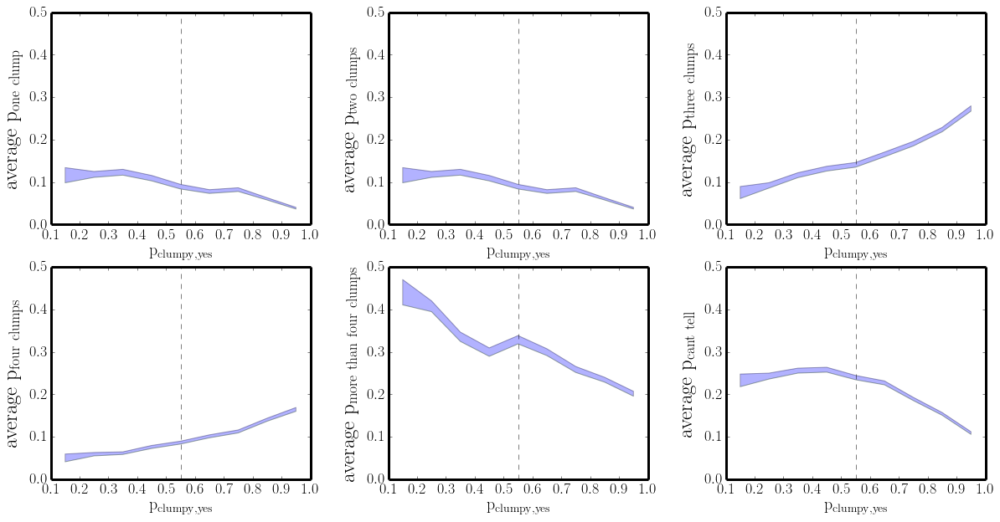

In [18]:
cut = .55

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(20,10))
gs=gridspec.GridSpec(2,3)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_1,alpha=.1)
plt.plot(p_prev_task_list,y2_1,alpha=.1)
plt.fill_between(p_prev_task_list,y1_1,y2_1,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{one~clump}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_2,alpha=.1)
plt.plot(p_prev_task_list,y2_2,alpha=.1)
plt.fill_between(p_prev_task_list,y1_2,y2_2,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{two~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,2])
plt.plot(p_prev_task_list,y1_3,alpha=.1)
plt.plot(p_prev_task_list,y2_3,alpha=.1)
plt.fill_between(p_prev_task_list,y1_3,y2_3,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{three~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)


plt.subplot(gs[1,0])
plt.plot(p_prev_task_list,y1_4,alpha=.1)
plt.plot(p_prev_task_list,y2_4,alpha=.1)
plt.fill_between(p_prev_task_list,y1_4,y2_4,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{four~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,1])
plt.plot(p_prev_task_list,y1_m4,alpha=.1)
plt.plot(p_prev_task_list,y2_m4,alpha=.1)
plt.fill_between(p_prev_task_list,y1_m4,y2_m4,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{more~than~four~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,2])
plt.plot(p_prev_task_list,y1_ct,alpha=.1)
plt.plot(p_prev_task_list,y2_ct,alpha=.1)
plt.fill_between(p_prev_task_list,y1_ct,y2_ct,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{cant~tell}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=cut,ls='dashed',color='k',alpha=.5)


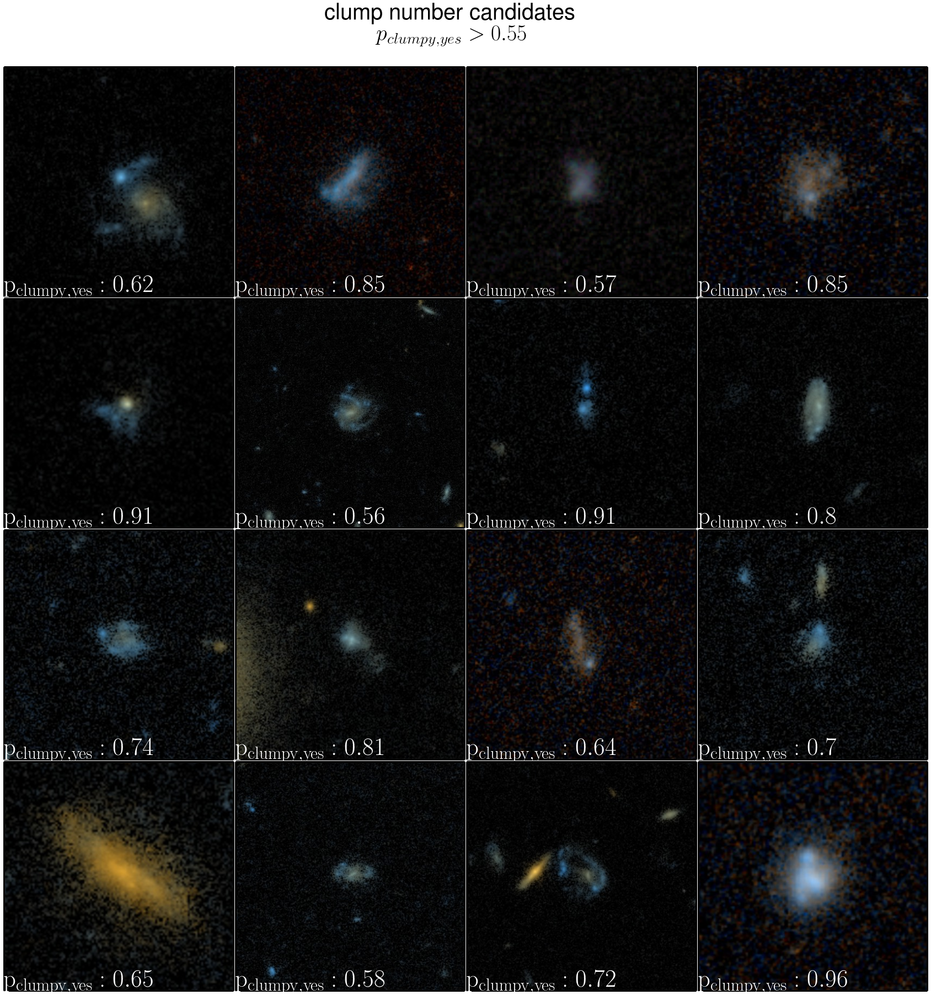

In [26]:
p_features_cut=0.52
p_clumpy_yes_cut=0.55
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria=(data[p_features]>p_features_cut) & (data[p_clumpy_yes]>p_clumpy_yes_cut) 

these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%(round(gal[p_clumpy_yes],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clump~number~candidates\n$p_{clumpy,yes} > %s$'%p_clumpy_yes_cut, fontsize=40,ha='center')



In [20]:
# Task 2: Edgeon Need p_features > 0.52, now to find what p_clumpy_no should be

#First define the task in question:
p_edgeon = 't02_edgeon_a01_yes_weighted_fraction' # vote fraction for task
N_edgeon = 't02_edgeon_total_weight' # number of votes for task
#and the previous task:
p_clumpy_no = 't12_clumpy_a02_no_weighted_fraction' # vote fraction for previous task
N_clumpy = 't12_clumpy_total_weight' # number of votes for previous task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_clumpy]>=N_cut) & (data[N_smooth_or_features]>=N_cut) & (data[N_edgeon]>=N_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_edgeon=[]
err_list_edgeon=[]


for p in p_prev_task_list:
    task_data = (data[p_clumpy_no]>p-.05) & (data[p_clumpy_no]<p+.05) & min_N & (data[p_features]>0.52)

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_edgeon.append(np.nanmean(data[task_data][p_1]))


    try:
        err_list_edgeon.append(np.nanstd(data[task_data][p_edgeon])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_edgeon.append(0)


y1_edgeon = [f+e for f,e in zip(fraction_list_edgeon,err_list_edgeon)]
y2_edgeon = [f-e for f,e in zip(fraction_list_edgeon,err_list_edgeon)]




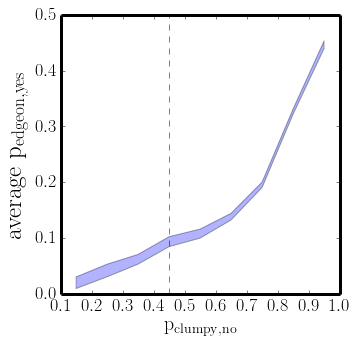

In [24]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(5,5))
gs=gridspec.GridSpec(1,1)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_edgeon,alpha=.1)
plt.plot(p_prev_task_list,y2_edgeon,alpha=.1)
plt.fill_between(p_prev_task_list,y1_edgeon,y2_edgeon,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{edgeon,yes}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,no}}$',fontsize=20)
plt.axvline(x=.45,ls='dashed',color='k',alpha=.5)


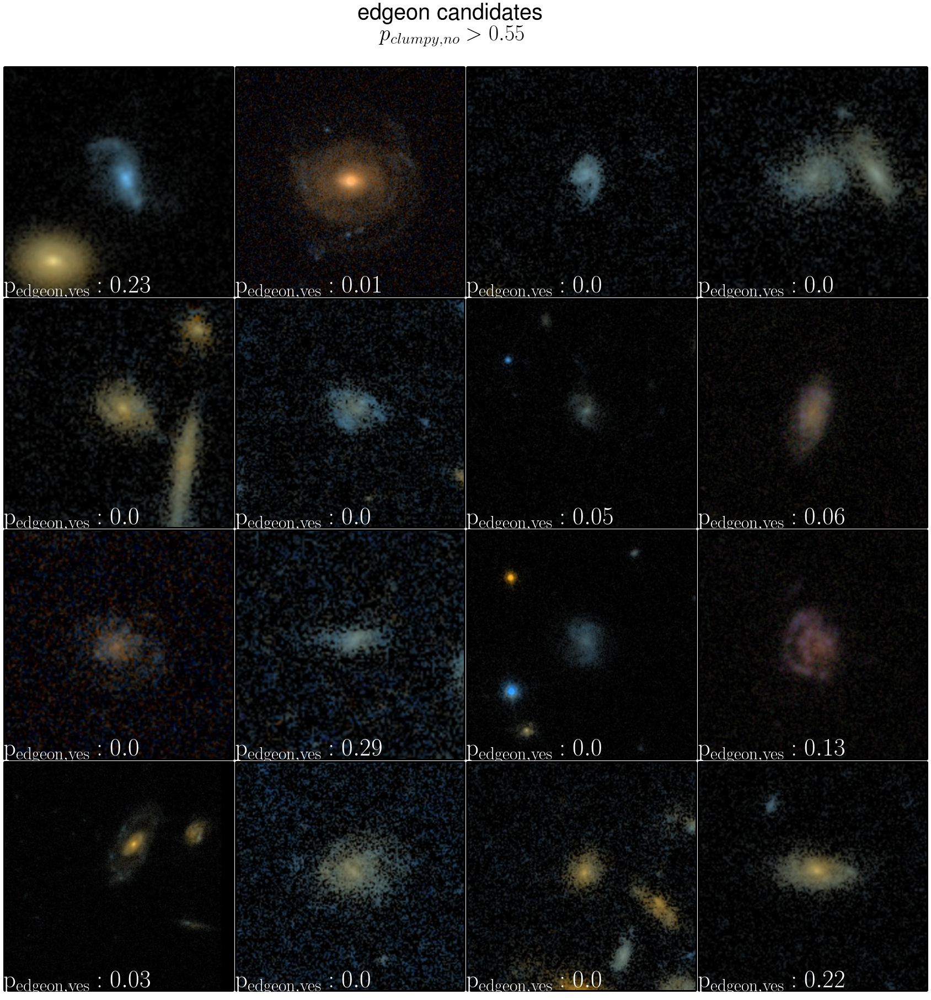

In [25]:
p_features_cut=0.52
p_clumpy_no_cut=0.55
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria=(data[p_features]>p_features_cut) & (data[p_clumpy_no]>p_clumpy_no_cut) 

these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{edgeon,yes}: %s}$'%(round(gal[p_edgeon],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'edgeon~candidates\n$p_{clumpy,no} > %s$'%p_clumpy_no_cut, fontsize=40,ha='center')

